In [2]:
import numpy as np
import matplotlib.pyplot as plt
import corner

# standard deviation of proposed step
sigmaq=0.05

# number of MCMC steps
Nsteps=100000

# plot asthetics 
#plt.rcParams['figure.figsize'] = [20, 12]  # set plotsize
#plt.rcParams.update({'font.size': 22})       # set fontsize

In [3]:
#test_data for linear model 
# max = 10
# min = 1
# N_points = 100
# x = np.linspace(min,max,N_points)
# sigma_x = 0.25
# sigma_y = 0.15
# p=0
# x_data = x+np.random.normal(0,sigma_x,N_points)
# a_synth = 1
# b_synth = 2
# y = a_synth+b_synth*x
# y_data = y+np.random.normal(0,sigma_y,N_points)
# plt.scatter(x_data,y_data)




In [4]:
def log_likelihood(a,b):
    #log log likehood for a two parameter linear system with correlated gaussian errors
    top = (y_data - a - b*x_data)*(y_data - a - b*x_data)
    bottom = 2*(b*b*sigma_x*sigma_x + sigma_y*sigma_y - 2*p*sigma_x*sigma_y*b)
    L= -np.sum(top/bottom)
    return L 

In [5]:
def log_prior(a,b): 
    return 0

In [6]:
def gaussV(sigma):
    #
    # it returns two samples from a normal distribution
    # centered at zero and with a standard deviation sigma
    # it uses the Box-Muller algorithm and the internal
    # random number generator, which is assumed to have been
    # seeded
    
    # draw two random numbers
    numrand=np.random.rand(2)

    # calculate two auxiliary quantities
    aux1=np.sqrt(-2.*np.log(numrand[0]))
    aux2=2.*np.pi*numrand[1]

    rand1=sigma*aux1*np.cos(aux2)
    rand2=sigma*aux1*np.sin(aux2)

    return rand1,rand2

In [7]:
# starting point of MCMC walkers
a=np.array([0.5])
b=np.array([1.8])

# accumulator of accepted steps
iaccept=1

# calculate probability for current position
L_cur=log_likelihood(a[0],a[0])
Pr_cur=log_prior(a[0],b[0]) 
Pcur = L_cur-Pr_cur
# take Nsteps MCMC steps
for iStep in np.arange(Nsteps):
    # first take two Gaussian steps
    stepA,stepB=gaussV(sigmaq)
    # take the step
    anew=a[len(a)-1]+stepA
    bnew=b[len(b)-1]+stepB

    # calculate the probability at the new location
    L_new=log_likelihood(anew,bnew)
    Pr_new = log_prior(anew,bnew)
    Pnew = L_new-Pr_new
    # calculate the Metropolis-Hastings ratio
    # note that this is the log of the ratio, so
    # we are taking differences
    Ratio=Pnew-Pcur

    # draw a random number from 0 to 1
    # and calculate its log
    prandom=np.log(np.random.rand(1))

    # decide whether to accept or not
    if (prandom<=Ratio):
        # accept the new location
        a=np.append(a,anew)
        b=np.append(b,bnew)
        # increase the number of accepted points
        iaccept+=1
        # update the "current" location
        Pcur=Pnew
    else:
        # repeat the old location
        a=np.append(a,a[len(a)-1])
        b=np.append(b,b[len(b)-1])

print("Acceptance ratio=",1.0*iaccept/Nsteps)  

NameError: name 'y_data' is not defined

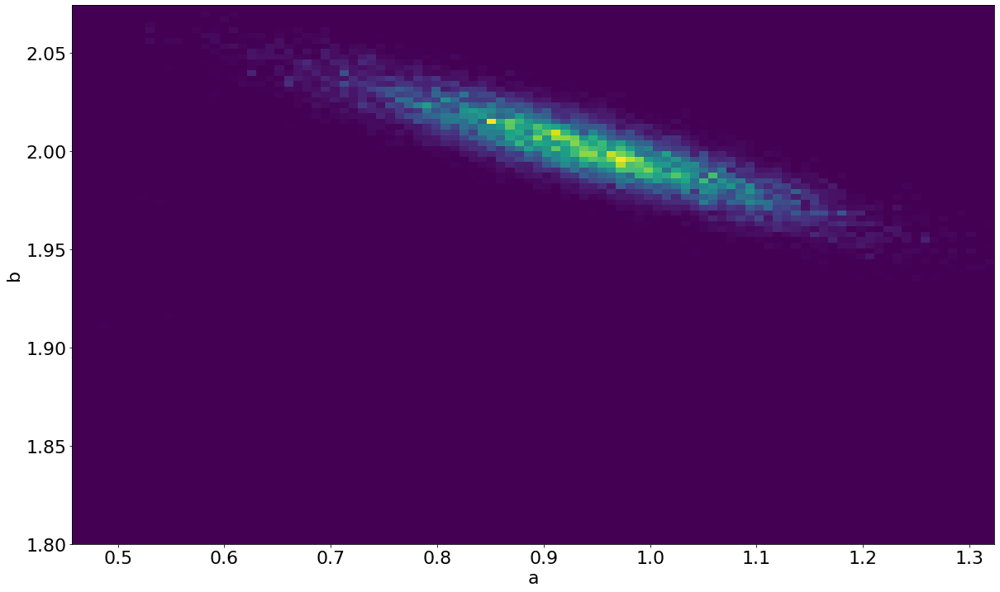

In [196]:
plt.hist2d(a,b,bins=100)
plt.xlabel('a')
plt.ylabel('b')
plt.show()

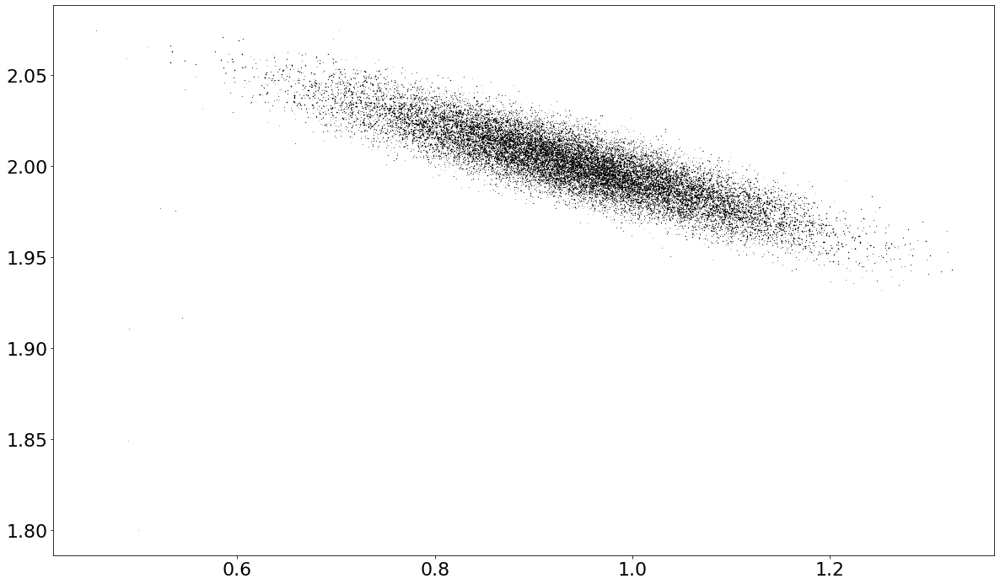

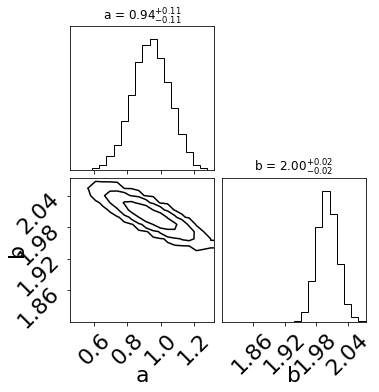

In [197]:
# to simply plot the MCMC points, uncomment the line below
plt.plot(a,b,'ko',ms=0.1)

# combine the two arrays into a single one
combined = np.vstack((a,b)).T

# uncomment the line below for a corner plot
figure = corner.corner(combined, labels=["a", "b"],
                       levels=[0.683,0.954,0.997],
                       plot_datapoints=False,
                       plot_density=False,
                       plot_contours=True,
                       show_titles=True, title_kwargs={"fontsize": 12})

plt.show()